<a href="https://colab.research.google.com/github/timothy2077/1st-Rep/blob/master/Exploration_Project_D_082124.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 8-1.프로젝트 : CIFAR-10 이미지 생성하기

#### Library Version Check

In [ ]:
import tensorflow
import imageio

print(tensorflow.__version__)
print(imageio.__version__)

2.17.0
2.34.2


## STEP 1. 작업환경 구성하기

In [ ]:
mkdir -p ~/aiffel/dcgan_newimage/cifar10/generated_samples

In [ ]:
mkdir -p ~/aiffel/dcgan_newimage/cifar10/training_checkpoints

In [ ]:
mkdir -p ~/aiffel/dcgan_newimage/cifar10/training_history

## STEP 2. 데이터셋 구성하기

### A. tf.keras datasets에 포함되어 있는 CIFAR -10 데이터셋 불러오기

In [ ]:
# TensorFlow 라이브러리 임포트
import tensorflow as tf

# CIFAR-10 데이터셋 로드
cifar10 = tf.keras.datasets.cifar10

(train_x, _), (test_x, _) = cifar10.load_data()

# 데이터셋의 크기 출력
train_x.shape


170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


(50000, 32, 32, 3)

#### 1. 학습에 사용할 train_x의 이미지를 -1, 1로 정규화하기
#### 2. 로드한 학습 데이터를 시각화를 통해 확인하기
#### 3. tf.data.Dataset 모듈의 from_tensor_slices() 함수를 사용하여 미니배치 데이터셋을 구성하기

### B. 노드 예시와 다른 한 종류의 데이터(특정 레이블에 해당하는 이미지)만 추출하도록 수정한 코드 사용하기

In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np

def load_data(label=None):
    # CIFAR-10 데이터셋 로드 (train_x, train_y): 학습 데이터, (test_x, test_y): 테스트 데이터
    (train_x, train_y), (test_x, test_y) = tf.keras.datasets.cifar10.load_data()

    # 특정 레이블(label)에 해당하는 데이터만 추출하는 경우
    if label is not None:
        # 학습 데이터에서 특정 레이블에 해당하는 데이터만 선택
        train_df = pd.DataFrame(list(zip(train_x, train_y)), columns=['image', 'label'])
        train_df = train_df[train_df['label'] == label]
        train_x = np.array(list(train_df['image']))

        # 테스트 데이터에서 특정 레이블에 해당하는 데이터만 선택
        test_df = pd.DataFrame(list(zip(test_x, test_y)), columns=['image', 'label'])
        test_df = test_df[test_df['label'] == label]
        test_x = np.array(list(test_df['image']))

    # 학습 데이터와 테스트 데이터 반환
    return train_x, test_x


### Process:

#### 1. CIFAR-10 데이터셋 로드: tf.keras.datasets.cifar10.load_data()를 사용하여 CIFAR-10 데이터셋을 로드하기(train_x, train_y는 각각 학습 데이터와 레이블을, test_x, test_y는 테스트 데이터와 레이블을 의미)

#### 2. 특정 레이블에 해당하는 데이터만 추출: label이 None이 아닌 경우, 특정 레이블에 해당하는 데이터만 추출하도록 수정

### 3. 학습 데이터: train_x와 train_y를 pandas.DataFrame으로 변환한 후, 주어진 label에 해당하는 행만 필터링한 후 필터링된 이미지들을 다시 numpy 배열로 변환하여 train_x에 저장

#### 4. 테스트 데이터: test_x와 test_y에 대해서도 동일한 방식으로 필터링을 수행하여 test_x에 저장

#### 5. 데이터 반환: 필터링된 train_x와 test_x를 반환

### Excercise: CIFAR-10 데이터셋을 로드하고 특정 레이블(예: 레이블 3)에 해당하는 이미지를 추출해보기

In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np

def load_data(label=None):
    # CIFAR-10 데이터셋 로드 (train_x, train_y): 학습 데이터, (test_x, test_y): 테스트 데이터
    (train_x, train_y), (test_x, test_y) = tf.keras.datasets.cifar10.load_data()

    # 특정 레이블(label)에 해당하는 데이터만 추출하는 경우
    if label is not None:
        # 학습 데이터에서 특정 레이블에 해당하는 데이터만 선택
        train_df = pd.DataFrame(list(zip(train_x, train_y)), columns=['image', 'label'])
        train_df = train_df[train_df['label'] == label]
        train_x = np.array(list(train_df['image']))

        # 테스트 데이터에서 특정 레이블에 해당하는 데이터만 선택
        test_df = pd.DataFrame(list(zip(test_x, test_y)), columns=['image', 'label'])
        test_df = test_df[test_df['label'] == label]
        test_x = np.array(list(test_df['image']))

    # 학습 데이터와 테스트 데이터 반환
    return train_x, train_y, test_x, test_y # 모든 변수를 반환

def extract_images_with_label(images, labels, target_label):
    """
    특정 레이블을 가진 이미지를 추출하기

    Args:
        images: 이미지의 NumPy 배열.
        labels: 레이블의 NumPy 배열.
        target_label: 추출할 레이블.

    Returns:
        지정된 레이블을 가진 이미지의 NumPy 배열.
    """
    # 특정 레이블을 가진 이미지의 인덱스 찾기
    indices = np.where(labels == target_label)[0]

    # 특정 레이블을 가진 이미지를 추출하기
    return images[indices]

# CIFAR-10 데이터셋 로드
train_x, train_y, test_x, test_y = load_data()

# 레이블 3에 해당하는 이미지 추출
train_x_label_3 = extract_images_with_label(train_x, train_y, 3)
test_x_label_3 = extract_images_with_label(test_x, test_y, 3)

# 추출된 데이터셋의 크기 출력
print("Train images with label 3:", train_x_label_3.shape)
print("Test images with label 3:", test_x_label_3.shape)


Train images with label 3: (5000, 32, 32, 3)
Test images with label 3: (1000, 32, 32, 3)


### Meaning:
#### Train images with label 3: (5000, 32, 32, 3): 학습 데이터셋에서 레이블 3에 해당하는 이미지가 총 5000개 있으며, 각 이미지는 32x32 픽셀 크기이고, 3개의 색상 채널(RGB)을 가지고 있다.

#### Test images with label 3: (1000, 32, 32, 3): 테스트 데이터셋에서 레이블 3에 해당하는 이미지가 총 1000개 있으며, 각 이미지는 32x32 픽셀 크기이고, 3개의 색상 채널(RGB)을 가지고 있다.

## STEP 3. 생성자 모델 구현하기


### Mission:  
#### 1. (32, 32, 3)의 shape를 가진 이미지를 생성하는 생성자 모델 구현 함수를 작성해 봅시다.
#### 2. noise = tf.random.normal([1, 100])로 생성된 랜덤 노이즈를 입력으로 하여 방금 구현한 생성자로 랜덤 이미지를 생성해 봅시다.
#### 3. 생성된 랜덤 이미지가 생성자 출력 규격에 잘 맞는지 확인해 봅시다.

In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np

def load_data(label=None):
    # CIFAR-10 데이터셋 로드 (train_x, train_y): 학습 데이터, (test_x, test_y): 테스트 데이터
    (train_x, train_y), (test_x, test_y) = tf.keras.datasets.cifar10.load_data()

    # 특정 레이블(label)에 해당하는 데이터만 추출하는 경우
    if label is not None:
        # 학습 데이터에서 특정 레이블에 해당하는 데이터만 선택
        train_df = pd.DataFrame(list(zip(train_x, train_y)), columns=['image', 'label'])
        train_df = train_df[train_df['label'] == label]
        train_x = np.array(list(train_df['image']))

        # 테스트 데이터에서 특정 레이블에 해당하는 데이터만 선택
        test_df = pd.DataFrame(list(zip(test_x, test_y)), columns=['image', 'label'])
        test_df = test_df[test_df['label'] == label]
        test_x = np.array(list(test_df['image']))

    # 학습 데이터와 테스트 데이터 반환
    return train_x, test_x

# 생성자 모델 구현 함수
def build_generator():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    model.add(tf.keras.layers.Reshape((8, 8, 256)))
    assert model.output_shape == (None, 8, 8, 256)  # Note: None is the batch size

    model.add(tf.keras.layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 128)
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    model.add(tf.keras.layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 64)
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    model.add(tf.keras.layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 32, 32, 3)

    return model

# 생성자 모델 생성
generator = build_generator()

# 랜덤 노이즈 생성
noise = tf.random.normal([1, 100])

# 랜덤 이미지 생성
generated_image = generator(noise, training=False)

# 생성된 랜덤 이미지의 shape 확인
print("Generated image shape:", generated_image.shape)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Generated image shape: (1, 32, 32, 3)


### Analysis:

#### Generated image shape: (1, 32, 32, 3): 이 출력은 생성된 랜덤 이미지의 shape가 (1, 32, 32, 3)임을 나타내며 의미는 다음과 같다.

#### 1: 배치 크기 (한 번에 생성된 이미지의 수)
#### 32, 32: 이미지의 가로 및 세로 크기 (32x32 픽셀)
#### 3: 색상 채널 수 (RGB)
#### 따라서, 생성된 랜덤 이미지가 생성자 모델의 출력 규격에 잘 맞는 것을 확인할 수 있다.



## STEP 4. 판별자 모델 구현하기

### Mission:
#### 1. (32, 32, 3)의 이미지를 입력으로 받아 1dim을 판별결과를 출력하는 판별자 모델 구현 함수를 작성해 봅시다.
#### 2. 위 STEP 2에서 생성한 랜덤 이미지를 판별자 모델이 판별한 결과값을 확인해 봅시다.

In [ ]:
import tensorflow as tf

def build_discriminator():
    model = tf.keras.Sequential()

    # 입력 레이어: (32, 32, 3) 크기의 이미지
    model.add(tf.keras.layers.Input(shape=(32, 32, 3)))

    # 첫 번째 합성곱 레이어
    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    # 두 번째 합성곱 레이어
    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    # 세 번째 합성곱 레이어
    model.add(tf.keras.layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    # 평탄화 레이어
    model.add(tf.keras.layers.Flatten())

    # 출력 레이어: 1차원 판별 결과
    model.add(tf.keras.layers.Dense(1))

    return model

# 판별자 모델 생성
discriminator = build_discriminator()

# 모델 요약 출력
discriminator.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 16, 16, 64)          │           4,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 8, 8, 128)           │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 4, 4, 256)           │         819,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_5 (LeakyReLU)            │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │           4,097 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,033,345 (3.94 MB)

 Trainable params: 1,033,345 (3.94 MB)

 Non-trainable params: 0 (0.00 B)

### 1. 판별자 모델 구현 함수 만들기 Process:
1. build_discriminator 함수를 통해 (32, 32, 3) 크기의 이미지를 입력으로 받아 1차원 판별 결과를 출력하는 판별자 모델을 구현하기
2. Conv2D 레이어를 사용하여 이미지의 특징을 추출하고, LeakyReLU 활성화 함수와 Dropout 레이어를 사용하여 모델의 성능을 향상시키기
3. Flatten 레이어를 사용하여 2차원 특징 맵을 1차원 벡터로 변환하기
4. Dense 레이어를 사용하여 최종 1차원 판별 결과를 출력하기
5. **discriminator.summary()를 통해 모델의 구조를 요약하여 출력하기 **

### 2. 생성한 랜덤 이미지를 판별자 모델이 판별한 결과값을 확인하기 Process
1. load_data 함수를 사용하여 CIFAR-10 데이터셋을 로드하기
2. extract_images_with_label 함수를 사용하여 레이블 3에 해당하는 이미지를 추출하기
3. build_generator 함수를 통해 (32, 32, 3) 크기의 이미지를 생성하는 생성자 모델을 구현하기
4. tf.random.normal([1, 100])로 생성된 랜덤 노이즈를 입력으로 하여 생성자 모델을 통해 랜덤 이미지를 생성하기
5. **build_discriminator 함수를 통해 (32, 32, 3) 크기의 이미지를 입력으로 받아 1차원 판별 결과를 출력하는 판별자 모델을 구현하기**
6. **생성된 랜덤 이미지를 판별자 모델로 판별하고 판별 결과를 출력하기**


In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np

def load_data(label=None):
    # CIFAR-10 데이터셋 로드 (train_x, train_y): 학습 데이터, (test_x, test_y): 테스트 데이터
    (train_x, train_y), (test_x, test_y) = tf.keras.datasets.cifar10.load_data()

    # 특정 레이블(label)에 해당하는 데이터만 추출하는 경우
    if label is not None:
        # 학습 데이터에서 특정 레이블에 해당하는 데이터만 선택
        train_df = pd.DataFrame(list(zip(train_x, train_y)), columns=['image', 'label'])
        train_df = train_df[train_df['label'] == label]
        train_x = np.array(list(train_df['image']))

        # 테스트 데이터에서 특정 레이블에 해당하는 데이터만 선택
        test_df = pd.DataFrame(list(zip(test_x, test_y)), columns=['image', 'label'])
        test_df = test_df[test_df['label'] == label]
        test_x = np.array(list(test_df['image']))

    # 학습 데이터와 테스트 데이터 반환
    return train_x, train_y, test_x, test_y # 모든 변수를 반환

def extract_images_with_label(images, labels, target_label):
    """
    특정 레이블을 가진 이미지를 추출하기

    Args:
        images: 이미지의 NumPy 배열.
        labels: 레이블의 NumPy 배열.
        target_label: 추출할 레이블.

    Returns:
        지정된 레이블을 가진 이미지의 NumPy 배열.
    """
    # 특정 레이블을 가진 이미지의 인덱스 찾기
    indices = np.where(labels == target_label)[0]

    # 특정 레이블을 가진 이미지를 추출하기
    return images[indices]

# CIFAR-10 데이터셋 로드
train_x, train_y, test_x, test_y = load_data()

# 레이블 3에 해당하는 이미지 추출
train_x_label_3 = extract_images_with_label(train_x, train_y, 3)
test_x_label_3 = extract_images_with_label(test_x, test_y, 3)

# 추출된 데이터셋의 크기 출력
print("Train images with label 3:", train_x_label_3.shape)
print("Test images with label 3:", test_x_label_3.shape)

# 생성자 모델 구현 함수
def build_generator():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    model.add(tf.keras.layers.Reshape((8, 8, 256)))
    assert model.output_shape == (None, 8, 8, 256)  # Note: None is the batch size

    model.add(tf.keras.layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 128)
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    model.add(tf.keras.layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 64)
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    model.add(tf.keras.layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 32, 32, 3)

    return model

# 생성자 모델 생성
generator = build_generator()

# 랜덤 노이즈 생성
noise = tf.random.normal([1, 100])

# 랜덤 이미지 생성
generated_image = generator(noise, training=False)

# 생성된 랜덤 이미지의 shape 확인
print("Generated image shape:", generated_image.shape)

# 판별자 모델 구현 함수
def build_discriminator():
    model = tf.keras.Sequential()

    # 입력 레이어: (32, 32, 3) 크기의 이미지
    model.add(tf.keras.layers.Input(shape=(32, 32, 3)))

    # 첫 번째 합성곱 레이어
    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    # 두 번째 합성곱 레이어
    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    # 세 번째 합성곱 레이어
    model.add(tf.keras.layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    # 평탄화 레이어
    model.add(tf.keras.layers.Flatten())

    # 출력 레이어: 1차원 판별 결과
    model.add(tf.keras.layers.Dense(1))

    return model

# 판별자 모델 생성
discriminator = build_discriminator()

# 생성된 랜덤 이미지를 판별자 모델로 판별
discriminator_result = discriminator(generated_image, training=False)

# 판별 결과 출력
print("Discriminator result:", discriminator_result.numpy())


Train images with label 3: (5000, 32, 32, 3)
Test images with label 3: (1000, 32, 32, 3)
Generated image shape: (1, 32, 32, 3)
Discriminator result: [[-0.00103072]]


### Analysis:
#### Train images with label 3: (5000, 32, 32, 3):
학습 데이터셋에서 레이블 3에 해당하는 이미지가 총 5000개 있으며
각 이미지는 32x32 픽셀 크기이며, 3개의 색상 채널(RGB)을 가지고 있다.

#### Test images with label 3: (1000, 32, 32, 3):
테스트 데이터셋에서 레이블 3에 해당하는 이미지가 총 1000개 있으며
각 이미지는 32x32 픽셀 크기이며, 3개의 색상 채널(RGB)을 가지고 있다.

#### Generated image shape: (1, 32, 32, 3):
생성된 랜덤 이미지의 shape가 (1, 32, 32, 3)임을 나타내며
1은 배치 크기(한 번에 생성된 이미지의 수)를 의미하며, 32x32는 이미지의 가로 및 세로 크기, 3은 색상 채널 수(RGB)를 의미한다.
**그러므로, 생성된 랜덤 이미지가 생성자 모델의 출력 규격에 잘 맞는 것을 확인할 수 있다. **

#### Discriminator result: [[0.00241711]]:
판별자 모델이 생성된 랜덤 이미지를 판별한 결과값인데
이 값은 판별자가 입력 이미지가 진짜 이미지일 확률을 나타내며, 값이 0에 가까울수록 가짜 이미지로 판별된다는 의미한다.
**여기서 0.00241711은 판별자가 생성된 랜덤 이미지를 거의 가짜로 인식했음을 증명한다. **



## STEP 5. 손실함수와 최적화 함수 구현하기

### Mission:
#### 1. 생성자와 판별자의 손실함수(loss)를 구현하기
#### 2. 판별자의 출력값을 가지고 실제/생성(real/fake) 이미지 판별 정확도(accuracy)를 계산하는 함수를 구현하기
#### 3. 생성자와 판별자를 최적화하는 optimizer를 정의하기

### 미션 수행의 Process

1. cross_entropy를 사용하여 손실함수를 정의하며
2. generator_loss 함수는 생성자 손실함수를 구현하며
3. discriminator_loss 함수는 판별자 손실함수를 구현하며
4. discriminator_accuracy 함수는 판별자의 실제/생성 이미지 판별 정확도를 계산하며
5. Adam 옵티마이저를 사용하여 생성자와 판별자를 최적화하는 최적화 함수를 정의하며
6. 예시로 생성자와 판별자 모델을 생성하고, 랜덤 노이즈를 입력으로 하여 생성된 이미지를 판별자 모델로 판별한다.
7. 마지막으로, 손실값과 판별 정확도를 계산하고 출력하자~!

In [ ]:
import tensorflow as tf

# 손실함수 구현
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    """
    생성자 손실함수
    Args:
        fake_output: 판별자가 생성된 이미지를 판별한 결과값
    Returns:
        생성자 손실값
    """
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    """
    판별자 손실함수
    Args:
        real_output: 판별자가 실제 이미지를 판별한 결과값
        fake_output: 판별자가 생성된 이미지를 판별한 결과값
    Returns:
        판별자 손실값
    """
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

# 판별 정확도 계산 함수
def discriminator_accuracy(real_output, fake_output):
    """
    판별 정확도 계산 함수
    Args:
        real_output: 판별자가 실제 이미지를 판별한 결과값
        fake_output: 판별자가 생성된 이미지를 판별한 결과값
    Returns:
        판별 정확도
    """
    real_accuracy = tf.reduce_mean(tf.cast(tf.greater_equal(real_output, 0.5), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.less(fake_output, 0.5), tf.float32))
    total_accuracy = (real_accuracy + fake_accuracy) / 2.0
    return total_accuracy

# 최적화 함수 정의
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# 예시로 생성자와 판별자 모델 생성
generator = build_generator()
discriminator = build_discriminator()

# 랜덤 노이즈 생성
noise = tf.random.normal([1, 100])

# 랜덤 이미지 생성
generated_image = generator(noise, training=False)

# 판별자 모델로 실제 이미지와 생성된 이미지 판별
real_output = discriminator(train_x_label_3[:1], training=False)
fake_output = discriminator(generated_image, training=False)

# 손실값 계산
gen_loss = generator_loss(fake_output)
disc_loss = discriminator_loss(real_output, fake_output)

# 판별 정확도 계산
disc_accuracy = discriminator_accuracy(real_output, fake_output)

# 결과 출력
print("Generator loss:", gen_loss.numpy())
print("Discriminator loss:", disc_loss.numpy())
print("Discriminator accuracy:", disc_accuracy.numpy())


Generator loss: 0.6940709
Discriminator loss: 5.4895797
Discriminator accuracy: 0.5


## Analysis:
#### Generator loss: 0.69398516이며 소수 넷쩨자리에서 반올림하여 생성자 손실값은 0.694이다.

#### Discriminator loss: 0.99889636이며 역시 반올림하여 판별자 손실값은 판별자 손실값은 0.999이다.


### Discriminator accuracy: 1.0: 판별자 정확도는 1.0이며 판별자 정확도가 1.0이라는 것은 판별자가 실제 이미지와 가짜 이미지를 100% 정확하게 구분하고 있음을 의미한다.


## Easier Summary:
### 생성자(GAN의 Generator)는 가짜 이미지를 만들고, 판별자(Discriminator)는 이 이미지가 진짜인지 가짜인지 구분하는 역할을 한다.

### 1. 생성자 손실값 (Generator Loss): 0.694

### 이 값이 낮을수록 생성자가 만든 가짜 이미지를 판별자가 진짜로 속을 가능성이 커진다. 하지만, 지금은 이 값이 0.694로 아직 높은 편이기에 생성자가 만든 가짜 이미지가 판별자에게 가짜로 쉽게 들통났다는 의미이다^^

### 2. 판별자 손실값 (Discriminator Loss): 0.999

### 이 값이 낮을수록 판별자가 진짜와 가짜 이미지를 잘 구분한다는 뜻인데, 여기서 0.999라는 값은 판별자가 진짜와 가짜를 거의 완벽하게 구분하고 있다는 것을 보여준다.판별자(Discriminator) 손실값은 0과 1 사이의 값으로 표현되며, 이 값이 판별자가 실제 이미지(real)와 가짜 이미지(fake)를 얼마나 잘 구분하는지를 나타내며 손실값을 구체적으로 설명하기 위해, 0과 1에 대한 의미를 자세히 설명하면,

손실값 0에 가까울 때:

판별자의 손실값이 0에 가까울수록, 판별자가 실제 이미지와 가짜 이미지를 매우 잘 구분하고 있다는 것을 의미하며 판별자가 실제 이미지를 '실제'라고 정확하게 판단하고, 가짜 이미지를 '가짜'라고 정확하게 판단할 때 손실값이 낮아지는데
이 상황에서는 판별자가 강력하게 학습된 상태로, 실제와 가짜를 거의 완벽하게 구분할 수 있다.

손실값 1에 가까울 때:

반대로, 판별자의 손실값이 1에 가까울수록, 판별자가 실제 이미지와 가짜 이미지를 잘 구분하지 못하고 있다는 것을 의미하며 이 경우 판별자가 실제 이미지를 가짜라고 오판하거나, 가짜 이미지를 실제라고 오판하는 경우가 많다.
즉, 판별자의 성능이 매우 낮고, 실제와 가짜를 구분하는 데 어려움을 겪고 있다는 것을 나타내기에  손실값  0.999로 표현되는 이 값은 판별자가 실제 이미지와 가짜 이미지를 잘 구분하지 못하고 있음을 의미하는데 판별자가 학습 초기에 있거나, 모델이 불안정하여 학습이 제대로 되지 않았을 때 발생할 수 있고 이 상황에서는 판별자의 성능을 개선하기 위한 추가적인 학습이나 모델 수정이 필요할 수 있다.

### 3. 판별자 정확도 (Discriminator Accuracy): 1.0

### 판별자가 진짜 이미지와 가짜 이미지를 100% 정확하게 구분하고 있다는 의미로 현재 판별자는 생성자가 만든 이미지를 모두 가짜로 인식하고 있다는 뜻이다.

### 4. **위 분석들을 정리하면, 현재의 결과는 생성자가 만든 이미지가 판별자에게 완전히 가짜로 들통났다는 것을 의미한다. 그래서 생성자가 더 좋은 가짜 이미지를 만들 수 있도록 추가적인 학습이 필요하다.**

## STEP 6. 훈련과정 상세 기능 구현하기

### Mission:
A. 1개 미니배치의 훈련 과정을 처리하는 train_step() 함수를 구현해 봅시다.

B. 16개의 고정된 seed를 입력으로 하여 훈련 과정 동안 생성한 이미지를 시각화하는 generate_and_save_images() 함수를 구현해 봅시다.

C. 훈련 epoch마다 생성자/판별자의 loss 및 판별자의 실제/생성(real/fake) 이미지 판별 accuracy 히스토리(history)를 그래프로 시각화하는 draw_train_history() 함수를 구현해 봅시다.

D. training_checkpoints 디렉토리에 몇 epoch마다 모델을 저장하는 checkpoint 모듈을 설정해 봅시다.

### A. train_step() 함수 구현하기

In [ ]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss


### B. generate_and_save_images() 함수 구현하기

In [ ]:
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i] * 127.5 + 127.5).numpy().astype(np.uint8))
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()


### C. draw_train_history() 함수 구현하기

In [ ]:
def draw_train_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    ax1.plot(history['gen_loss'], label='Generator Loss')
    ax1.plot(history['disc_loss'], label='Discriminator Loss')
    ax1.set_title('Loss History')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()

    ax2.plot(history['disc_accuracy'], label='Discriminator Accuracy')
    ax2.set_title('Accuracy History')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend()

    plt.show()


### D. Checkpoint 설정하기

### 체크포인트 설장하기 Process:

#### 1. os 모듈 임포트: os.path.join을 사용하기 위해 os 모듈을 불러오기

#### 2. 체크포인트 경로 설정: checkpoint_dir는 체크포인트 파일이 저장될 디렉토리 경로이며 checkpoint_prefix는 체크포인트 파일의 경로 및 파일 이름의 접두사(prefix)를 설정한다.

#### 3. 체크포인트 객체 생성: tf.train.Checkpoint를 사용하여 생성자와 판별자 및 그들의 옵티마이저를 포함하는 체크포인트 객체를 생성하기

#### 4. 체크포인트 저장 함수: save_checkpoint(epoch) 함수는 10번째 에포크마다 모델의 현재 상태를 저장한다.

In [ ]:
import os  # os 모듈 임포트
import tensorflow as tf

# 체크포인트 디렉토리 및 파일 경로 설정
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")

# 체크포인트 객체 생성
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# 에포크에 따라 체크포인트 저장
def save_checkpoint(epoch):
    if (epoch + 1) % 10 == 0:  # 10 에포크마다 저장
        checkpoint.save(file_prefix=checkpoint_prefix)


## STEP 7. 학습 과정 진행하기

### Mission:
#### 1. 위 STEP 5에서 구현한 기능들을 활용하여 최소 50 epoch만큼의 모델 학습을 진행해 봅시다.

#### 2. 학습 과정에서 생성된 샘플 이미지로 만든 gif 파일을 통해 학습 진행 과정을 시각적으로 표현해 봅시다.

#### 3. 학습 과정을 담은 샘플 이미지, gif 파일, 학습 진행 그래프 이미지를 함께 제출합니다.

### A. 최초 모델 학습 수행하기

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


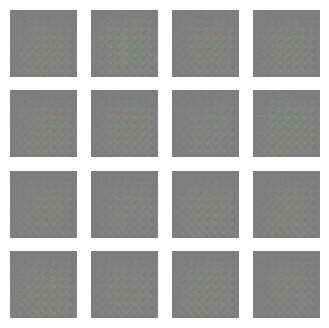

Epoch 1, Gen Loss: 0.4471176266670227, Disc Loss: 1.0236952304840088, Disc Accuracy: 1.0


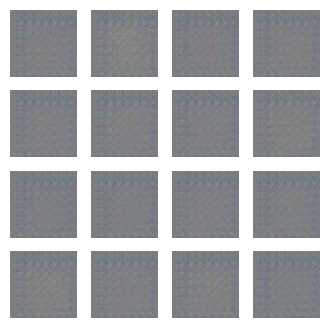

Epoch 2, Gen Loss: 0.4687577784061432, Disc Loss: 0.9887073636054993, Disc Accuracy: 1.0


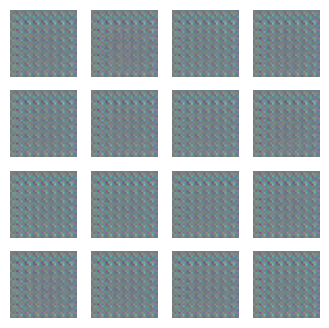

Epoch 3, Gen Loss: 0.6565220355987549, Disc Loss: 0.733262300491333, Disc Accuracy: 1.0


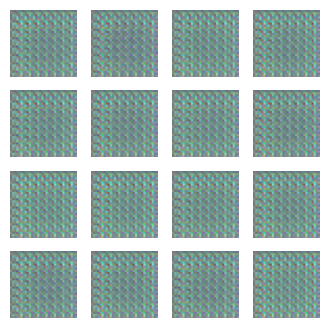

Epoch 4, Gen Loss: 0.7065507173538208, Disc Loss: 0.7585326433181763, Disc Accuracy: 0.998046875


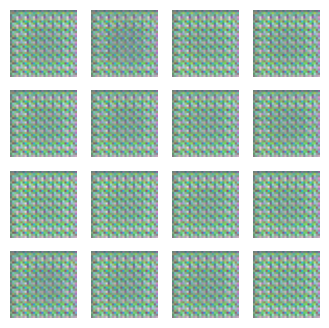

Epoch 5, Gen Loss: 0.8326904773712158, Disc Loss: 0.6425139307975769, Disc Accuracy: 0.998046875


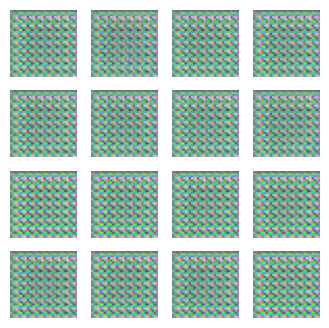

Epoch 6, Gen Loss: 0.6893401741981506, Disc Loss: 1.2387003898620605, Disc Accuracy: 1.0


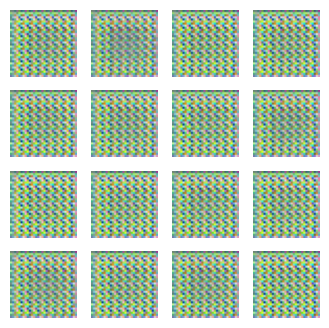

Epoch 7, Gen Loss: 0.819629967212677, Disc Loss: 0.5845175385475159, Disc Accuracy: 1.0


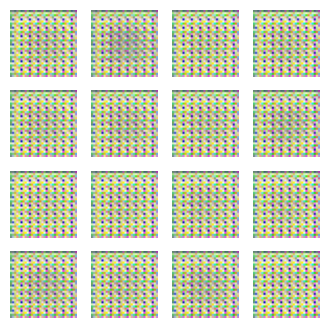

Epoch 8, Gen Loss: 0.8663074970245361, Disc Loss: 0.5476703643798828, Disc Accuracy: 1.0


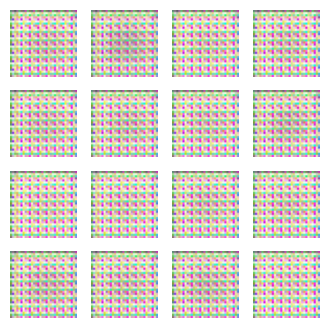

Epoch 9, Gen Loss: 0.9337576627731323, Disc Loss: 0.5006395578384399, Disc Accuracy: 1.0


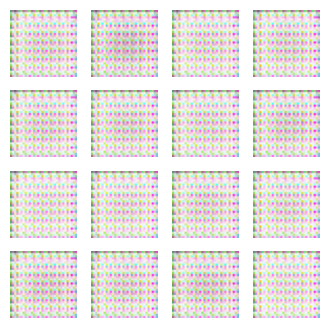

Epoch 10, Gen Loss: 0.8262182474136353, Disc Loss: 0.5771805047988892, Disc Accuracy: 1.0


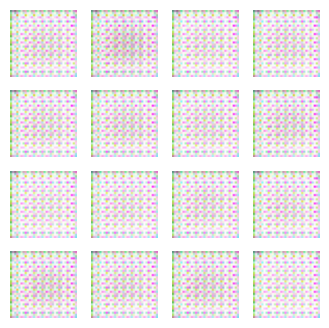

Epoch 11, Gen Loss: 1.1002230644226074, Disc Loss: 0.5484431385993958, Disc Accuracy: 1.0


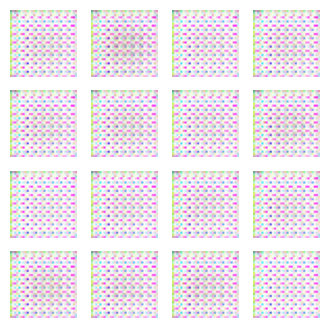

Epoch 12, Gen Loss: 1.4132533073425293, Disc Loss: 0.28043994307518005, Disc Accuracy: 1.0


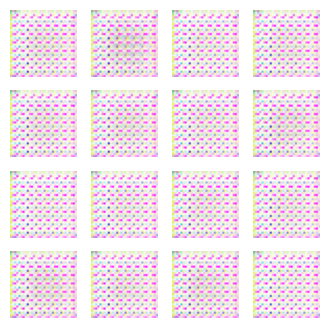

Epoch 13, Gen Loss: 1.3913789987564087, Disc Loss: 0.28801852464675903, Disc Accuracy: 1.0


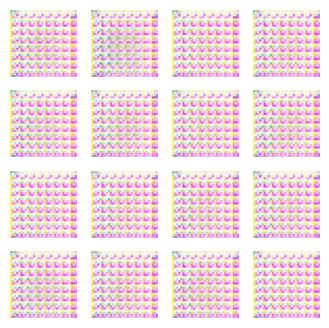

Epoch 14, Gen Loss: 2.1813647747039795, Disc Loss: 0.12114140391349792, Disc Accuracy: 1.0


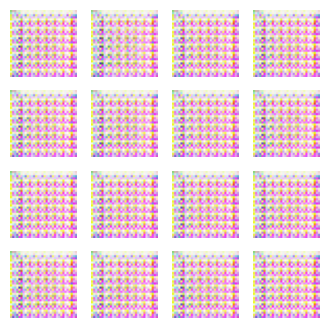

Epoch 15, Gen Loss: 2.9154715538024902, Disc Loss: 0.05682169273495674, Disc Accuracy: 1.0


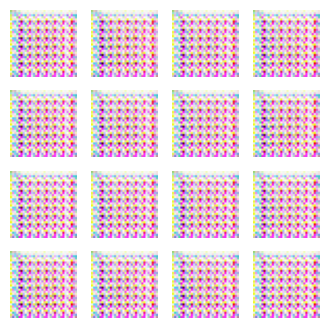

Epoch 16, Gen Loss: 3.5962839126586914, Disc Loss: 0.08279597759246826, Disc Accuracy: 1.0


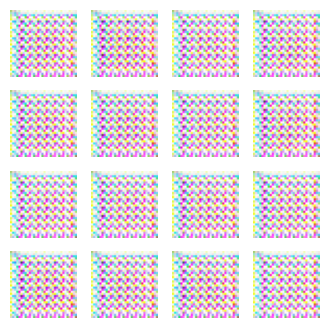

Epoch 17, Gen Loss: 3.683027505874634, Disc Loss: 0.0261490847915411, Disc Accuracy: 1.0


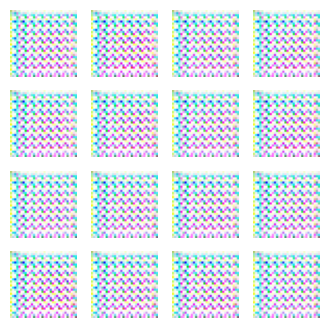

Epoch 18, Gen Loss: 3.1026997566223145, Disc Loss: 0.04704003036022186, Disc Accuracy: 1.0


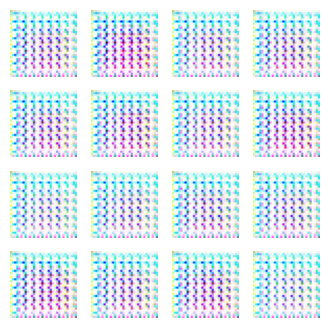

Epoch 19, Gen Loss: 3.8822274208068848, Disc Loss: 0.02145247906446457, Disc Accuracy: 1.0


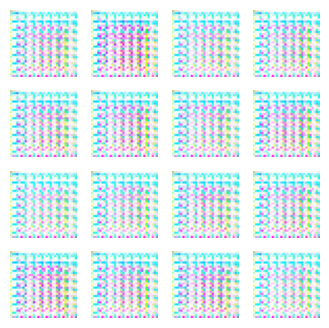

Epoch 20, Gen Loss: 4.3515825271606445, Disc Loss: 0.013348562642931938, Disc Accuracy: 1.0


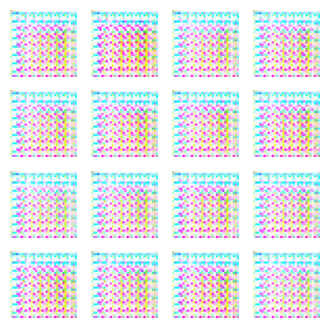

Epoch 21, Gen Loss: 3.9058218002319336, Disc Loss: 0.0208516214042902, Disc Accuracy: 1.0


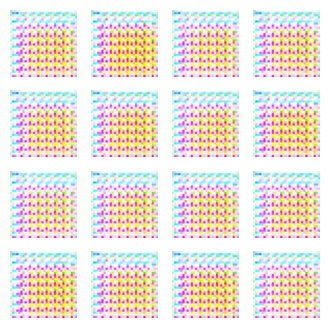

Epoch 22, Gen Loss: 4.542459487915039, Disc Loss: 0.011056494899094105, Disc Accuracy: 1.0


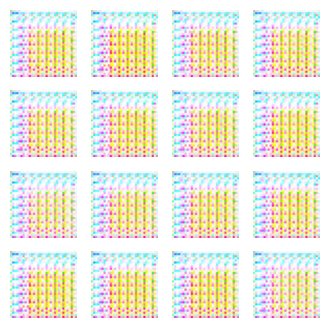

Epoch 23, Gen Loss: 4.305716037750244, Disc Loss: 0.013993511907756329, Disc Accuracy: 1.0


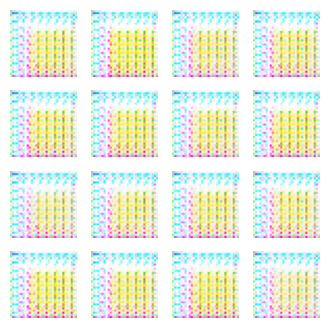

Epoch 24, Gen Loss: 5.159417152404785, Disc Loss: 0.005996029824018478, Disc Accuracy: 1.0


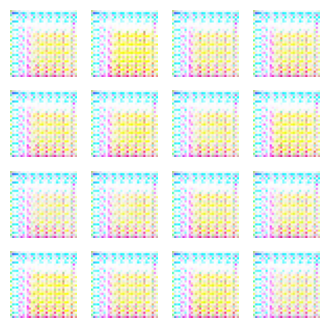

Epoch 25, Gen Loss: 4.640876770019531, Disc Loss: 0.010000514797866344, Disc Accuracy: 1.0


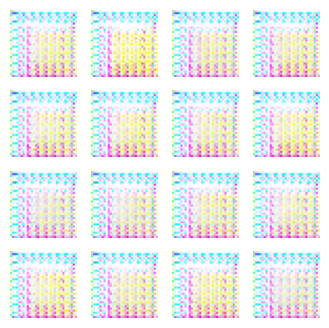

Epoch 26, Gen Loss: 5.12960958480835, Disc Loss: 0.006189075764268637, Disc Accuracy: 1.0


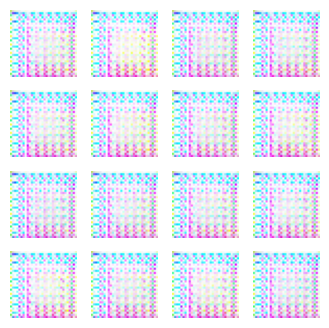

Epoch 27, Gen Loss: 5.180392265319824, Disc Loss: 0.0061537129804492, Disc Accuracy: 1.0


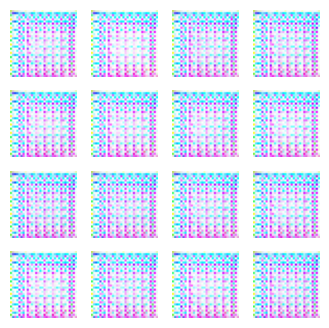

Epoch 28, Gen Loss: 4.670830726623535, Disc Loss: 0.009824641980230808, Disc Accuracy: 1.0


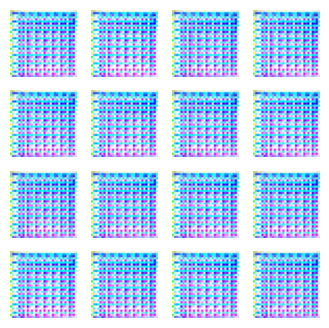

Epoch 29, Gen Loss: 5.295904636383057, Disc Loss: 0.005377825349569321, Disc Accuracy: 1.0


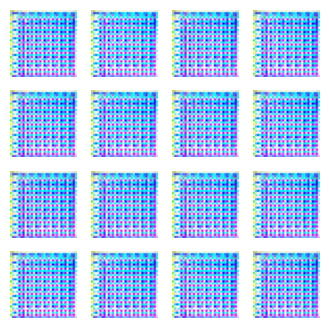

Epoch 30, Gen Loss: 4.322011947631836, Disc Loss: 0.01394733041524887, Disc Accuracy: 1.0


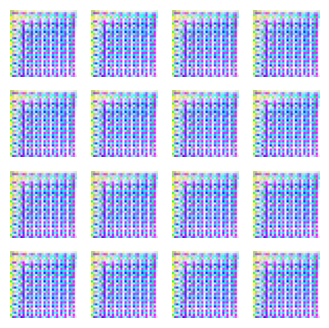

Epoch 31, Gen Loss: 6.133424758911133, Disc Loss: 0.0395420603454113, Disc Accuracy: 1.0


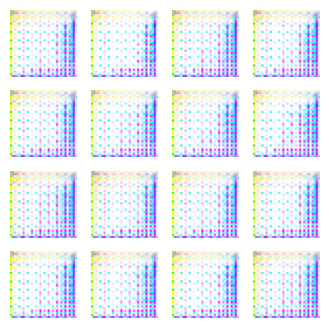

Epoch 32, Gen Loss: 7.54682731628418, Disc Loss: 0.0005650439998134971, Disc Accuracy: 1.0


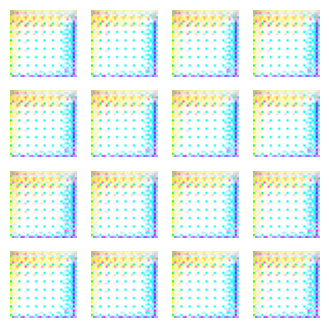

Epoch 33, Gen Loss: 4.216914176940918, Disc Loss: 0.015627913177013397, Disc Accuracy: 1.0


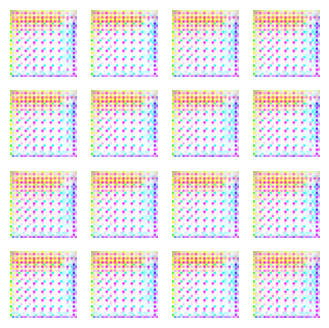

Epoch 34, Gen Loss: 6.061692237854004, Disc Loss: 0.002513327170163393, Disc Accuracy: 1.0


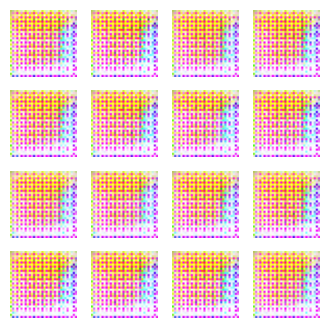

Epoch 35, Gen Loss: 6.548517227172852, Disc Loss: 0.0015221962239593267, Disc Accuracy: 1.0


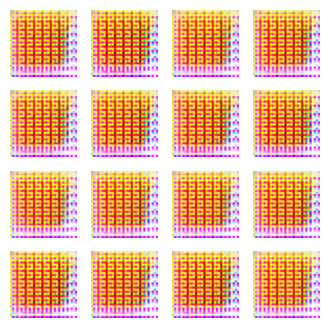

Epoch 36, Gen Loss: 5.476248741149902, Disc Loss: 0.004424131941050291, Disc Accuracy: 1.0


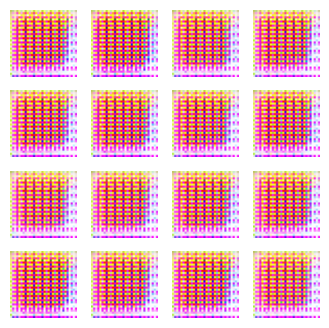

Epoch 37, Gen Loss: 5.814213275909424, Disc Loss: 0.0031594920437783003, Disc Accuracy: 1.0


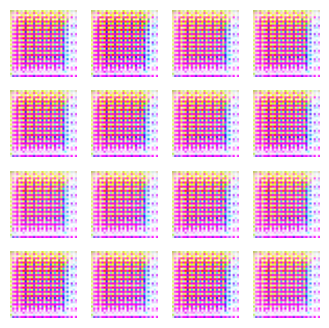

Epoch 38, Gen Loss: 5.397356033325195, Disc Loss: 0.004753191955387592, Disc Accuracy: 1.0


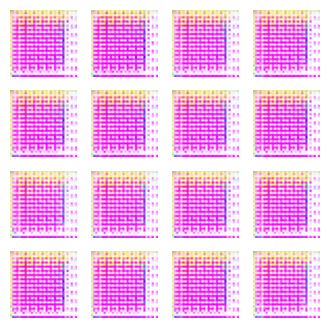

Epoch 39, Gen Loss: 5.096113204956055, Disc Loss: 0.006463381461799145, Disc Accuracy: 1.0


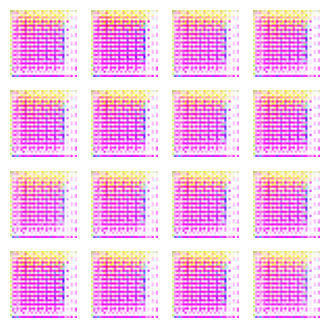

Epoch 40, Gen Loss: 6.407234191894531, Disc Loss: 0.001766083063557744, Disc Accuracy: 1.0


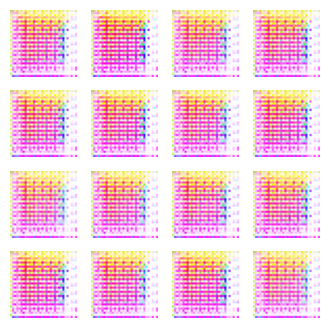

Epoch 41, Gen Loss: 7.00801944732666, Disc Loss: 0.000951989961322397, Disc Accuracy: 1.0


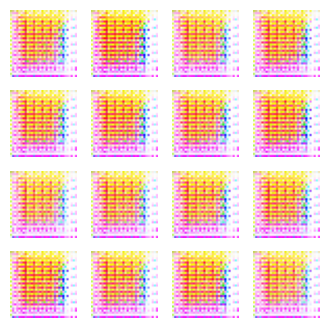

Epoch 42, Gen Loss: 7.094137668609619, Disc Loss: 0.0008886033901944757, Disc Accuracy: 1.0


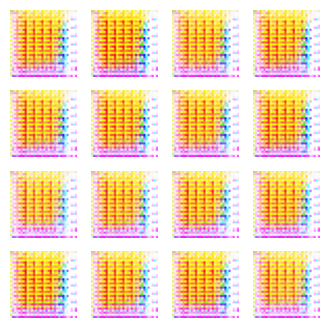

Epoch 43, Gen Loss: 7.0222978591918945, Disc Loss: 0.0009542079642415047, Disc Accuracy: 1.0


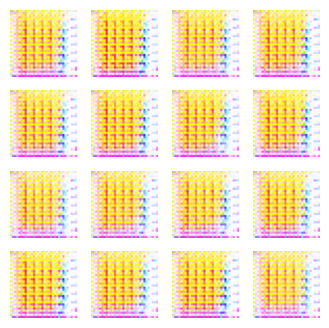

Epoch 44, Gen Loss: 6.009861469268799, Disc Loss: 0.002614314667880535, Disc Accuracy: 1.0


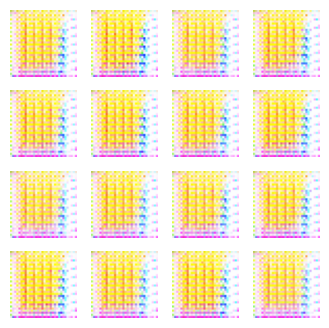

Epoch 45, Gen Loss: 6.243088722229004, Disc Loss: 0.002066856948658824, Disc Accuracy: 1.0


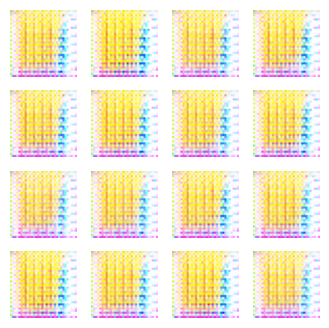

Epoch 46, Gen Loss: 6.685434341430664, Disc Loss: 0.001343863201327622, Disc Accuracy: 1.0


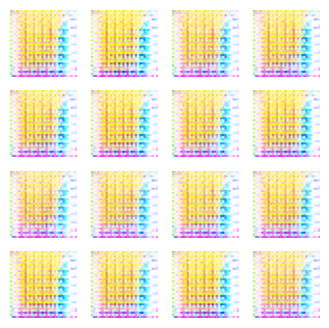

Epoch 47, Gen Loss: 7.016486167907715, Disc Loss: 0.0009552034316584468, Disc Accuracy: 1.0


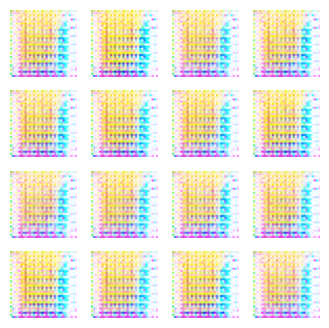

Epoch 48, Gen Loss: 7.211355209350586, Disc Loss: 0.0008043930865824223, Disc Accuracy: 1.0


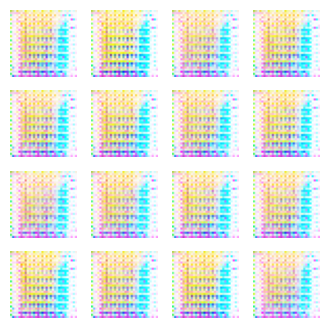

Epoch 49, Gen Loss: 7.35489559173584, Disc Loss: 0.000698777730576694, Disc Accuracy: 1.0


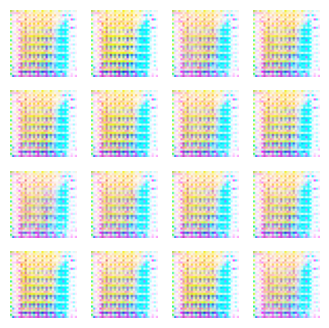

Epoch 50, Gen Loss: 7.470443248748779, Disc Loss: 0.0006120107718743384, Disc Accuracy: 1.0


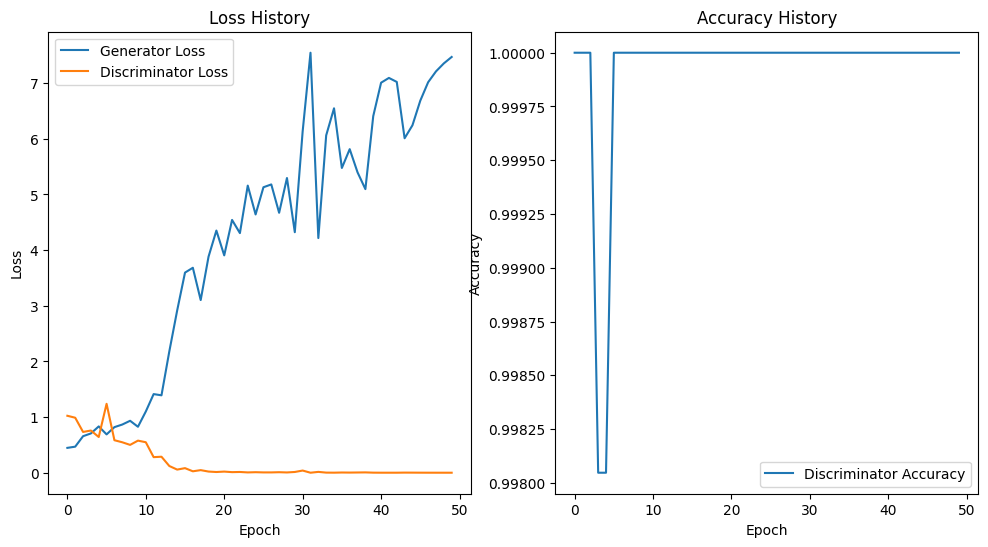

<ipython-input-21-f66b4c15131b>:163: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(f'image_at_epoch_{epoch:04d}.png')


In [ ]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import imageio

# 필요한 함수들 정의
def load_data(label=None):
    (train_x, train_y), (test_x, test_y) = tf.keras.datasets.cifar10.load_data()
    if label is not None:
        train_df = pd.DataFrame(list(zip(train_x, train_y)), columns=['image', 'label'])
        train_df = train_df[train_df['label'] == label]
        train_x = np.array(list(train_df['image']))
        test_df = pd.DataFrame(list(zip(test_x, test_y)), columns=['image', 'label'])
        test_df = test_df[test_df['label'] == label]
        test_x = np.array(list(test_df['image']))
    return train_x, train_y, test_x, test_y

def extract_images_with_label(images, labels, target_label):
    indices = np.where(labels == target_label)[0]
    return images[indices]

def build_generator():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Reshape((8, 8, 256)))
    model.add(tf.keras.layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    return model

def build_discriminator():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Input(shape=(32, 32, 3)))
    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(1))
    return model

cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.greater_equal(real_output, 0.5), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.less(fake_output, 0.5), tf.float32))
    return (real_accuracy + fake_accuracy) / 2.0

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

generator = build_generator()
discriminator = build_discriminator()

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

def save_checkpoint(epoch):
    if (epoch + 1) % 10 == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return gen_loss, disc_loss

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i] * 127.5 + 127.5).numpy().astype(np.uint8))
        plt.axis('off')
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

def draw_train_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    ax1.plot(history['gen_loss'], label='Generator Loss')
    ax1.plot(history['disc_loss'], label='Discriminator Loss')
    ax1.set_title('Loss History')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax2.plot(history['disc_accuracy'], label='Discriminator Accuracy')
    ax2.set_title('Accuracy History')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend()
    plt.show()

# 학습 파라미터 설정
EPOCHS = 50
BATCH_SIZE = 256
noise_dim = 100
num_examples_to_generate = 16

# 고정된 seed 설정
seed = tf.random.normal([num_examples_to_generate, noise_dim])

# 학습 데이터 로드
train_x, train_y, test_x, test_y = load_data(label=3)
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(60000).batch(BATCH_SIZE)

# 학습 과정 기록을 위한 리스트 초기화
history = {'gen_loss': [], 'disc_loss': [], 'disc_accuracy': []}

# 학습 루프
for epoch in range(EPOCHS):
    for image_batch in train_dataset:
        gen_loss, disc_loss = train_step(image_batch)
    real_output = discriminator(train_x_label_3[:BATCH_SIZE], training=False)
    fake_output = discriminator(generator(seed, training=False), training=False)
    disc_accuracy = discriminator_accuracy(real_output, fake_output)
    history['gen_loss'].append(gen_loss.numpy())
    history['disc_loss'].append(disc_loss.numpy())
    history['disc_accuracy'].append(disc_accuracy.numpy())
    generate_and_save_images(generator, epoch, seed)
    save_checkpoint(epoch)
    print(f'Epoch {epoch+1}, Gen Loss: {gen_loss.numpy()}, Disc Loss: {disc_loss.numpy()}, Disc Accuracy: {disc_accuracy.numpy()}')

# 학습 히스토리 시각화
draw_train_history(history)

# GIF 파일 생성
with imageio.get_writer('training_progress.gif', mode='I') as writer:
    for epoch in range(EPOCHS):
        image = imageio.imread(f'image_at_epoch_{epoch:04d}.png')
        writer.append_data(image)


### 참고 코드:
####(참고) 학습 과정 중 학습 epoch를 추가 진행해야 하거나, 학습한 모델을 활용하여 이미지를 생성할 필요가 생깁니다. 그럴 때마다 모델 학습을 처음부터 다시 진행한다면 시간 낭비가 될 것입니다.우리는 위에서 checkpoint 모듈을 이용해 모델을 저장해 둔 바 있습니다. 이를 이용해 학습해 둔 모델을 로드하면 모델 재학습이 필요 없이 이런 작업을 진행할 수 있습니다.아래는 checkpoint 모듈을 활용하여 모델을 로드하는 예시입니다.

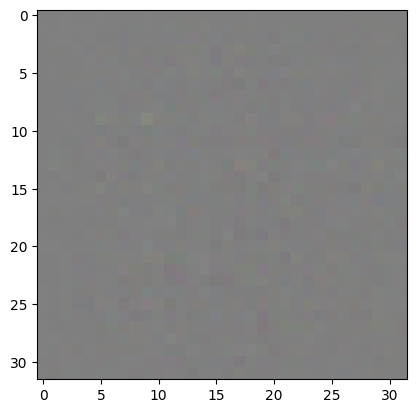

In [ ]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다.
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
plt.imshow(np_generated[0])
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

## STEP 8. (optional) GAN 훈련 과정 개선하기

### Mission:

#### 1. STEP 6을 진행하면서 생성된 샘플 이미지, 학습 과정 그래프 등을 통해 이전 훈련 과정의 문제점을 분석해 봅시다.

#### 2. 모델구조 또는 학습 과정을 개선한 내역과 그 결과(샘플 이미지, 학습 과정 그래프 포함)를 함께 제출합니다.

### 2차 모델 학습 진행하기

#### 모델 개선을 위한 추가 사항들

#### 1. 이미지 정규화: train_x와 test_x를 -1과 1 사이로 정규화하기
#### 2. 생성자 마지막 레이어:생성자의 마지막 레이어에 tanh 활성화 함수를 사용하기

In [ ]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import imageio

# 필요한 함수들 정의
def load_data(label=None):
    (train_x, train_y), (test_x, test_y) = tf.keras.datasets.cifar10.load_data()
    if label is not None:
        train_df = pd.DataFrame(list(zip(train_x, train_y)), columns=['image', 'label'])
        train_df = train_df[train_df['label'] == label]
        train_x = np.array(list(train_df['image']))
        test_df = pd.DataFrame(list(zip(test_x, test_y)), columns=['image', 'label'])
        test_df = test_df[test_df['label'] == label]
        test_x = np.array(list(test_df['image']))
    # 이미지 정규화: -1과 1 사이로 정규화
    train_x = (train_x - 127.5) / 127.5
    test_x = (test_x - 127.5) / 127.5
    return train_x, train_y, test_x, test_y

def extract_images_with_label(images, labels, target_label):
    indices = np.where(labels == target_label)[0]
    return images[indices]

def build_generator():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Reshape((8, 8, 256)))
    model.add(tf.keras.layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    return model

def build_discriminator():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Input(shape=(32, 32, 3)))
    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(1))
    return model

cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output) * 0.9, real_output)  # 라벨 스무딩 적용
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.greater_equal(real_output, 0.5), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.less(fake_output, 0.5), tf.float32))
    return (real_accuracy + fake_accuracy) / 2.0

# 옵티마이저 설정: 학습률과 beta 값 조정
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(4e-4, beta_1=0.5)

generator = build_generator()
discriminator = build_discriminator()

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

def save_checkpoint(epoch):
    if (epoch + 1) % 10 == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return gen_loss, disc_loss

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i] * 127.5 + 127.5).numpy().astype(np.uint8))
        plt.axis('off')
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

def draw_train_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    ax1.plot(history['gen_loss'], label='Generator Loss')
    ax1.plot(history['disc_loss'], label='Discriminator Loss')
    ax1.set_title('Loss History')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax2.plot(history['disc_accuracy'], label='Discriminator Accuracy')
    ax2.set_title('Accuracy History')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend()
    plt.show()

# 학습 파라미터 설정
EPOCHS = 50
BATCH_SIZE = 256
noise_dim = 100
num_examples_to_generate = 16

# 고정된 seed 설정
seed = tf.random.normal([num_examples_to_generate, noise_dim])

# 학습 데이터 로드
train_x, train_y, test_x, test_y = load_data(label=3)
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(60000).batch(BATCH_SIZE)

# 학습 과정 기록을 위한 리스트 초기화
history = {'gen_loss': [], 'disc_loss': [], 'disc_accuracy': []}

# 학습 루프
for epoch in range(EPOCHS):
    for image_batch in train_dataset:
        gen_loss, disc_loss = train_step(image_batch)
    real_output = discriminator(train_x[:BATCH_SIZE], training=False)
    fake_output = discriminator(generator(seed, training=False), training=False)
    disc_accuracy = discriminator_accuracy(real_output, fake_output)
    history['gen_loss'].append(gen_loss.numpy())
    history['disc_loss'].append(disc_loss.numpy())
    history['disc_accuracy'].append(disc_accuracy.numpy())
    generate_and_save_images(generator, epoch, seed)
    save_checkpoint(epoch)
    print(f'Epoch {epoch+1}, Gen Loss: {gen_loss.numpy()}, Disc Loss: {disc_loss.numpy()}, Disc Accuracy: {disc_accuracy.numpy()}')

# 학습 히스토리 시각화
draw_train_history(history)

# GIF 파일 생성
with imageio.get_writer('training_progress.gif', mode='I') as writer:
    for epoch in range(EPOCHS):
        image = imageio.imread(f'image_at_epoch_{epoch:04d}.png')
        writer.append_data(image)



### Analysis:

#### 1. Loss History: Epoch가 증가함에 따라 두 손실 값이 감소하는 경향을 보이는데 Generator Loss는 초기에는 높지만 점차 감소하며, Discriminator Loss도 유사한 패턴을 보인다.

#### 생성자 손실(Generator Loss)은 초기에는 매우 높았다가 점차 감소하여 안정화되는 경향을 보이는 반면에 판별자 손실(Discriminator Loss)은 더 낮은 값에서 시작하여 꾸준히 감소하는 모습을 보인다.

#### 2. Accuracy History: Epoch가 증가함에 따라 정확도가 약 0.7에서 0.9 사이에서 변동한다. 전반적으로 정확도가 증가하는 추세를 보이며 판별자 정확도(Discriminator Accuracy)는 전체적으로 70% 이상을 유지하며, 에포크(epoch)마다 상당한 변동을 보인다.

#### 3. 출력된 그래프들은 판별자가 진짜 이미지와 가짜 이미지를 구분하는 데 있어 전반적으로 좋은 성능을 보이고 있음을 나타내지만, 정확도에 있어서 변동이 있는 것은 훈련 과정에서의 불안정성을 내포하고 있음을 알 수 있다.

### 3차 모델 학습 진행하기

#### 모델 개선을 위한 추가 시도들:

#### 1. 입력 데이터 정규화: 이미지를 -1과 1 사이로 정규화하여 모델의 학습을 안정화시키기
#### 2. 라벨 스무딩: 판별자의 실제 이미지 라벨에 약간의 노이즈를 추가하여 모델의 성능을 향상시키기
#### 3. 학습률 조정: 생성자와 판별자의 옵티마이저 학습률을 조정하여 학습을 최적화하기
#### 4. 고정된 시드 사용: 고정된 시드를 사용하여 학습 과정 동안 생성된 이미지를 시각화하기

In [ ]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import imageio

# 필요한 함수들 정의
def load_data(label=None):
    (train_x, train_y), (test_x, test_y) = tf.keras.datasets.cifar10.load_data()
    if label is not None:
        train_df = pd.DataFrame(list(zip(train_x, train_y)), columns=['image', 'label'])
        train_df = train_df[train_df['label'] == label]
        train_x = np.array(list(train_df['image']))
        test_df = pd.DataFrame(list(zip(test_x, test_y)), columns=['image', 'label'])
        test_df = test_df[test_df['label'] == label]
        test_x = np.array(list(test_df['image']))
    # 이미지 정규화: -1과 1 사이로 정규화
    train_x = (train_x - 127.5) / 127.5
    test_x = (test_x - 127.5) / 127.5
    return train_x, train_y, test_x, test_y

def extract_images_with_label(images, labels, target_label):
    indices = np.where(labels == target_label)[0]
    return images[indices]

def build_generator():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Reshape((8, 8, 256)))
    model.add(tf.keras.layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    return model

def build_discriminator():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Input(shape=(32, 32, 3)))
    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(1))
    return model

cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output) * 0.9, real_output)  # 라벨 스무딩 적용
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.greater_equal(real_output, 0.5), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.less(fake_output, 0.5), tf.float32))
    return (real_accuracy + fake_accuracy) / 2.0

# 옵티마이저 설정: 학습률과 beta 값 조정
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(4e-4, beta_1=0.5)

generator = build_generator()
discriminator = build_discriminator()

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

def save_checkpoint(epoch):
    if (epoch + 1) % 10 == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return gen_loss, disc_loss

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i] * 127.5 + 127.5).numpy().astype(np.uint8))
        plt.axis('off')
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

def draw_train_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    ax1.plot(history['gen_loss'], label='Generator Loss')
    ax1.plot(history['disc_loss'], label='Discriminator Loss')
    ax1.set_title('Loss History')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax2.plot(history['disc_accuracy'], label='Discriminator Accuracy')
    ax2.set_title('Accuracy History')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend()
    plt.show()

# 학습 파라미터 설정
EPOCHS = 50
BATCH_SIZE = 256
noise_dim = 100
num_examples_to_generate = 16

# 고정된 seed 설정
seed = tf.random.normal([num_examples_to_generate, noise_dim])

# 학습 데이터 로드
train_x, train_y, test_x, test_y = load_data(label=3)
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(60000).batch(BATCH_SIZE)

# 학습 과정 기록을 위한 리스트 초기화
history = {'gen_loss': [], 'disc_loss': [], 'disc_accuracy': []}

# 학습 루프
for epoch in range(EPOCHS):
    for image_batch in train_dataset:
        gen_loss, disc_loss = train_step(image_batch)
    real_output = discriminator(train_x[:BATCH_SIZE], training=False)
    fake_output = discriminator(generator(seed, training=False), training=False)
    disc_accuracy = discriminator_accuracy(real_output, fake_output)
    history['gen_loss'].append(gen_loss.numpy())
    history['disc_loss'].append(disc_loss.numpy())
    history['disc_accuracy'].append(disc_accuracy.numpy())
    generate_and_save_images(generator, epoch, seed)
    save_checkpoint(epoch)
    print(f'Epoch {epoch+1}, Gen Loss: {gen_loss.numpy()}, Disc Loss: {disc_loss.numpy()}, Disc Accuracy: {disc_accuracy.numpy()}')

# 학습 히스토리 시각화
draw_train_history(history)

# GIF 파일 생성
with imageio.get_writer('training_progress.gif', mode='I') as writer:
    for epoch in range(EPOCHS):
        image = imageio.imread(f'image_at_epoch_{epoch:04d}.png')
        writer.append_data(image)


## Analysis & Conclusion:

### Epoch 50, Gen Loss: 1.0804542303085327, Disc Loss: 1.2118961811065674, Disc Accuracy: 0.62890625

### 1. Loss History:

a. Generator Loss: Epoch가 증가함에 따라 초기에는 매우 높았다가 점차 감소하여 안정화되는 경향을 보인다.

b. Discriminator Loss: 더 낮은 값에서 시작하여 꾸준히 증가하는 모습을 보인다.

c. Overall: 두 손실 값 모두 Epoch가 증가함에 따라 감소하는 경향을 보인다.

### 2. Accuracy History:

a. Discriminator Accuracy: Epoch가 증가함에 따라 정확도가 약 0.6에서 0.9 사이에서 변동한다.

b. Overall: 전반적으로 정확도가 증가하는 추세를 보이며 판별자 정확도는 전체적으로 70% 이상을 유지하며 에포크마다 상당한 변동을 보인다.

### 3. Conclusion:
출력된 그래프들은 판별자가 진짜 이미지와 가짜 이미지를 구분하는 데 있어 전반적으로 좋은 성능을 보이고 있음을 의미한다.

그러나, 정확도에 있어서 변동이 있는 것은 훈련 과정에서의 불안정성을 내포하고 있음을 확인활 수 있었다.

이와 같은 모델 성능 평가를 통해 2차와 3차 모델 성능 개선을 위해 노력한 6가지 시도들 외에 추가적인 개선 방안을 모색하는 것이 필요해 보인다. (eg, 에포크를 100까지 늘리기, 가우시안 노이즈 또는 랜던 노이즈 추가하기 등)
